**PREPARED BY IBRAHIM ABU SAIID**

---




# Genetic Variant Classification with Machine Learning

---

This notebook focuses on analyzing the ClinVar dataset to predict conflicting classifications for genetic variants. Using machine learning techniques, the project aims to classify variants based on their attributes, identifying whether their classifications are consistent or conflicting.

---


##**Content**
1. **Data Preprocessing**:
   - Drop columns with over 15% missing values and those with more than 3,000 unique values.
   - Impute missing values using the mode.
   - Encode categorical variables with label encoding.

2. **Training Various Classification Models**:
   - Train K-Nearest Neighbors (KNN), Decision Tree, and Logistic Regression models on the preprocessed dataset.
   - Evaluate models using metrics like accuracy, precision, recall, and F1-score.

3. **Performing Basic Feature Selection Techniques**:
   - Use pair plots and correlation matrices to identify and remove redundant features.
   - Select features with correlation coefficients above 0.8 for removal to avoid multicollinearity.
   - Retrain and evaluate models on the updated dataset.

4. **Performing One Filter or Wrapper Feature Selection Technique**:
   - Use Lasso regression to select relevant features based on non-zero coefficients.
   - Train models using the Lasso-selected features and evaluate their performance.

---

In [17]:
# Data access: Mounting Google Drive for access
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
import pandas as pd

# Reading the CSV file from drive into a DataFrame
df = pd.read_csv('drive/MyDrive/clinvar_conflicting.csv')

# Displaying the first few rows of the DataFrame
df.head()

<ipython-input-18-9ca95a9a0a61>:4: DtypeWarning: Columns (0,38,40) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('drive/MyDrive/clinvar_conflicting.csv')


,CHROM,POS,REF,ALT,AF_ESP,AF_EXAC,AF_TGP,CLNDISDB,CLNDISDBINCL,CLNDN,...,SIFT,PolyPhen,MOTIF_NAME,MOTIF_POS,HIGH_INF_POS,MOTIF_SCORE_CHANGE,LoFtool,CADD_PHRED,CADD_RAW,BLOSUM62
0,1,1168180,G,C,0.0771,0.10020,0.1066,MedGen:CN169374,NaN,not_specified,...,tolerated,benign,NaN,NaN,NaN,NaN,NaN,1.053,-0.208682,2.0
1,1,1470752,G,A,0.0000,0.00000,0.0000,"MedGen:C1843891,OMIM:607454,Orphanet:ORPHA9877...",NaN,Spinocerebellar_ataxia_21|not_provided,...,deleterious_low_confidence,benign,NaN,NaN,NaN,NaN,NaN,31.000,6.517838,-3.0
2,1,1737942,A,G,0.0000,0.00001,0.0000,"Human_Phenotype_Ontology:HP:0000486,MedGen:C00...",NaN,Strabismus|Nystagmus|Hypothyroidism|Intellectu...,...,deleterious,probably_damaging,NaN,NaN,NaN,NaN,NaN,28.100,6.061752,-1.0
3,1,2160305,G,A,0.0000,0.00000,0.0000,"MedGen:C1321551,OMIM:182212,SNOMED_CT:83092002...",NaN,Shprintzen-Goldberg_syndrome|not_provided,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.500,3.114491,NaN
4,1,2160305,G,T,0.0000,0.00000,0.0000,"MedGen:C1321551,OMIM:182212,SNOMED_CT:83092002",NaN,Shprintzen-Goldberg_syndrome,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.700,4.766224,-3.0


In [19]:
# Check the shape of the DataFrame
print("Shape of the DataFrame:")
df.shape

Shape of the DataFrame:


(65188, 46)

In [20]:
# Display basic information about the DataFrame
print("Information about the DataFrame:")
df.info()

Information about the DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65188 entries, 0 to 65187
Data columns (total 46 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CHROM               65188 non-null  object 
 1   POS                 65188 non-null  int64  
 2   REF                 65188 non-null  object 
 3   ALT                 65188 non-null  object 
 4   AF_ESP              65188 non-null  float64
 5   AF_EXAC             65188 non-null  float64
 6   AF_TGP              65188 non-null  float64
 7   CLNDISDB            65188 non-null  object 
 8   CLNDISDBINCL        167 non-null    object 
 9   CLNDN               65188 non-null  object 
 10  CLNDNINCL           167 non-null    object 
 11  CLNHGVS             65188 non-null  object 
 12  CLNSIGINCL          167 non-null    object 
 13  CLNVC               65188 non-null  object 
 14  CLNVI               27659 non-null  object 
 15  MC                  

In [21]:
# Generate descriptive statistics of the DataFrame
print("Descriptive statistics of the DataFrame:")
df.describe()

Descriptive statistics of the DataFrame:


,POS,AF_ESP,AF_EXAC,AF_TGP,ORIGIN,SSR,CLASS,DISTANCE,STRAND,MOTIF_POS,MOTIF_SCORE_CHANGE,LoFtool,CADD_PHRED,CADD_RAW,BLOSUM62
count,6.518800e+04,65188.000000,65188.000000,65188.000000,65188.000000,130.000000,65188.000000,108.000000,65174.000000,2.0,2.000000,60975.000000,64096.000000,64096.000000,25593.000000
mean,7.757594e+07,0.014511,0.014492,0.015263,1.342486,2.269231,0.252102,825.731481,-0.006659,1.0,-0.080000,0.345058,15.685616,2.554131,-0.402258
std,5.974051e+07,0.057795,0.059542,0.059527,5.688772,4.190777,0.434223,1069.363315,0.999985,0.0,0.024042,0.361238,10.836350,2.961553,1.872684
min,9.610000e+02,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,-1.000000,1.0,-0.097000,0.000069,0.001000,-5.477391,-3.000000
25%,3.254179e+07,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,55.500000,-1.000000,1.0,-0.088500,0.024300,7.141000,0.462951,-2.000000
50%,5.797021e+07,0.000000,0.000040,0.000000,1.000000,1.000000,0.000000,469.000000,-1.000000,1.0,-0.080000,0.157000,14.090000,1.642948,-1.000000
75%,1.127454e+08,0.001200,0.001230,0.001600,1.000000,1.000000,1.000000,1415.000000,1.000000,1.0,-0.071500,0.710000,24.100000,4.381392,1.000000
max,2.476080e+08,0.499000,0.499890,0.499800,513.000000,16.000000,1.000000,4759.000000,1.000000,1.0,-0.063000,1.000000,99.000000,46.556261,3.000000


## **Data Preprocessing**

In this section, we will preprocess the dataset before  training the dataset using various classification models to ensure data quality and compatibility with the model:



1. **Drop Columns with More than 15% Null Values** - We will remove columns that have more than 15% null values to ensure data quality.
2. **Remove Columns with More than 3000 Unique Values** - Columns with a large number of unique values can lead to high dimensionality and may not contribute significantly to the model. We'll remove such columns.
3. **Impute Missing Values** - Missing values will be imputed using mode to ensure completeness in the dataset.
4. **Encoding Categorical Variables** - Categorical variables will be converted into numerical representations using label encoding.




---



1. **Drop Columns with More than 15% Null Values** - We will remove columns that have more than 15% null values to ensure data quality.

In [22]:
# Calculate the percentage of null values for each column
null_percentage = (df.isnull().sum() / len(df)) * 100

# Create a DataFrame to display the null percentages
null_percentage_df = pd.DataFrame({'Column': null_percentage.index, 'Null Percentage': null_percentage.values})

# Sort the DataFrame by null percentages in ascending order
null_percentage_df = null_percentage_df.sort_values(by='Null Percentage', ascending=False)

# Print the DataFrame showing null percentages
print("Null Percentage of Each Column:")
print(null_percentage_df)


Null Percentage of Each Column:
                Column  Null Percentage
41  MOTIF_SCORE_CHANGE        99.996932
40        HIGH_INF_POS        99.996932
39           MOTIF_POS        99.996932
38          MOTIF_NAME        99.996932
33            DISTANCE        99.834325
17                 SSR        99.800577
12          CLNSIGINCL        99.743818
8         CLNDISDBINCL        99.743818
10           CLNDNINCL        99.743818
27              INTRON        86.495981
37            PolyPhen        61.962324
36                SIFT        61.900963
45            BLOSUM62        60.739707
14               CLNVI        57.570412
35            BAM_EDIT        50.958765
32              Codons        15.346383
31         Amino_acids        15.346383
30    Protein_position        15.271216
29        CDS_position        15.271216
26                EXON        13.642081
28       cDNA_position        13.628275
42             LoFtool         6.462846
43          CADD_PHRED         1.675155
44      

In [23]:
# Drop columns with more than the defined threshold of null values
columns_to_drop = null_percentage_df[null_percentage_df['Null Percentage'] > 20]['Column']
df = df.drop(columns=columns_to_drop, axis=1)

# Display the columns to be dropped
print("\nColumns with more than 20% null values (to be dropped):")
print(columns_to_drop.tolist())

# Display the shape of the DataFrame after dropping columns
print("\nShape of DataFrame after dropping columns:", df.shape)


Columns with more than 20% null values (to be dropped):
['MOTIF_SCORE_CHANGE', 'HIGH_INF_POS', 'MOTIF_POS', 'MOTIF_NAME', 'DISTANCE', 'SSR', 'CLNSIGINCL', 'CLNDISDBINCL', 'CLNDNINCL', 'INTRON', 'PolyPhen', 'SIFT', 'BLOSUM62', 'CLNVI', 'BAM_EDIT']

Shape of DataFrame after dropping columns: (65188, 31)


In [24]:
# Display basic information of the DataFrame after dropping columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65188 entries, 0 to 65187
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   CHROM             65188 non-null  object 
 1   POS               65188 non-null  int64  
 2   REF               65188 non-null  object 
 3   ALT               65188 non-null  object 
 4   AF_ESP            65188 non-null  float64
 5   AF_EXAC           65188 non-null  float64
 6   AF_TGP            65188 non-null  float64
 7   CLNDISDB          65188 non-null  object 
 8   CLNDN             65188 non-null  object 
 9   CLNHGVS           65188 non-null  object 
 10  CLNVC             65188 non-null  object 
 11  MC                64342 non-null  object 
 12  ORIGIN            65188 non-null  int64  
 13  CLASS             65188 non-null  int64  
 14  Allele            65188 non-null  object 
 15  Consequence       65188 non-null  object 
 16  IMPACT            65188 non-null  object


---




2. **Remove Columns with More than 3000 Unique Values** - Columns with a large number of unique values can lead to high dimensionality and may not contribute significantly to the model. We'll remove such columns.

In [25]:
# Calculate the number of unique values for each column
unique_values_count = df.nunique()

# Create a DataFrame to display the number of unique values
unique_values_df = pd.DataFrame({'Column': unique_values_count.index, 'Unique Values Count': unique_values_count.values})

# Print the DataFrame showing unique values count
print("Unique Values Count of Each Column:")
print(unique_values_df)

Unique Values Count of Each Column:
              Column  Unique Values Count
0              CHROM                   38
1                POS                63115
2                REF                  866
3                ALT                  458
4             AF_ESP                 2842
5            AF_EXAC                 6667
6             AF_TGP                 2087
7           CLNDISDB                 9234
8              CLNDN                 9260
9            CLNHGVS                65188
10             CLNVC                    7
11                MC                   90
12            ORIGIN                   31
13             CLASS                    2
14            Allele                  374
15       Consequence                   48
16            IMPACT                    4
17            SYMBOL                 2328
18      Feature_type                    2
19           Feature                 2369
20           BIOTYPE                    2
21              EXON                 326

In [26]:
# Drop columns with more than 3000 of unique values
columns_to_drop_unique_values = unique_values_df[unique_values_df['Unique Values Count'] > 3000]['Column']
df = df.drop(columns=columns_to_drop_unique_values)

# Display the columns to be dropped
print("\nColumns with more than 3000 unique values (to be dropped):")
print(columns_to_drop_unique_values.tolist())

# Display the shape of the DataFrame after dropping columns
print("\nShape of DataFrame after dropping columns with more than 3000 unique values:", df.shape)


Columns with more than 3000 unique values (to be dropped):
['POS', 'AF_EXAC', 'CLNDISDB', 'CLNDN', 'CLNHGVS', 'EXON', 'cDNA_position', 'CDS_position', 'Protein_position', 'CADD_PHRED', 'CADD_RAW']

Shape of DataFrame after dropping columns with more than 3000 unique values: (65188, 20)


In [27]:
df.nunique()

CHROM             38
REF              866
ALT              458
AF_ESP          2842
AF_TGP          2087
CLNVC              7
MC                90
ORIGIN            31
CLASS              2
Allele           374
Consequence       48
IMPACT             4
SYMBOL          2328
Feature_type       2
Feature         2369
BIOTYPE            2
Amino_acids     1262
Codons          2220
STRAND             2
LoFtool         1195
dtype: int64



---



3. **Impute Missing Values** - Missing values will be imputed using mode to ensure completeness in the dataset.

In [28]:
# Display null values of each column
print(df.isnull().sum())

CHROM               0
REF                 0
ALT                 0
AF_ESP              0
AF_TGP              0
CLNVC               0
MC                846
ORIGIN              0
CLASS               0
Allele              0
Consequence         0
IMPACT              0
SYMBOL             16
Feature_type       14
Feature            14
BIOTYPE            16
Amino_acids     10004
Codons          10004
STRAND             14
LoFtool          4213
dtype: int64


In [29]:
from sklearn.impute import SimpleImputer

# Define the imputer with the mode strategy
imputer = SimpleImputer(strategy='most_frequent')

# Impute missing values for all columns
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Verify if there are any remaining missing values
print("Remaining missing values:")
print(df.isnull().sum())

Remaining missing values:
CHROM           0
REF             0
ALT             0
AF_ESP          0
AF_TGP          0
CLNVC           0
MC              0
ORIGIN          0
CLASS           0
Allele          0
Consequence     0
IMPACT          0
SYMBOL          0
Feature_type    0
Feature         0
BIOTYPE         0
Amino_acids     0
Codons          0
STRAND          0
LoFtool         0
dtype: int64




---



4. **Encoding Categorical Variables** - Categorical variables will be converted into numerical representations using label encoding.

In [30]:
from sklearn.preprocessing import LabelEncoder

# Initialize a LabelEncoder object
label_encoder = LabelEncoder()

# Iterate over each categorical column in the DataFrame
for col in df.select_dtypes(include=['object']).columns:
    # Convert non-numeric values to strings
    df[col] = df[col].astype(str)
    # Initialize a LabelEncoder object
    label_encoder = LabelEncoder()
    # Fit label encoder and transform values in each column
    df[col] = label_encoder.fit_transform(df[col])

# Display the encoded DataFrame
print("Encoded DataFrame:")
df.head()

Encoded DataFrame:


,CHROM,REF,ALT,AF_ESP,AF_TGP,CLNVC,MC,ORIGIN,CLASS,Allele,Consequence,IMPACT,SYMBOL,Feature_type,Feature,BIOTYPE,Amino_acids,Codons,STRAND,LoFtool
0,0,437,106,753,614,6,19,1,0,88,17,2,200,1,1700,1,257,1653,1,1168
1,0,437,0,0,0,6,19,1,0,1,17,2,2135,1,463,1,756,1143,0,1168
2,0,0,213,0,0,6,24,17,1,168,17,2,892,1,849,1,480,813,0,1168
3,0,437,0,0,0,6,19,16,0,1,17,2,1889,1,1893,1,377,523,1,1168
4,0,437,335,0,0,6,19,16,0,296,17,2,1889,1,1893,1,362,525,1,1168




---



## **Training Various Classification Models**
In this section, we will train three different classification models: K-Nearest Neighbors (KNN), Decision Tree, and Logistic Regression. These models will be trained on the preprocessed dataset to predict whether a ClinVar variant will have conflicting classifications. We will train each of these models on the preprocessed dataset and evaluate their performance using graphs of the appropriate evaluation metrics such as accuracy, precision, recall, and F1-score.

In [31]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Split the dataset into features (X) and target variable (y)
X = df.drop(columns=['CLASS'])
y = df['CLASS']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
# Define models
models = {
    'K-Nearest Neighbors (KNN)': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression()
}

# Define empty lists to store class-wise evaluation metrics
class_models = []
class_labels = []
precisions = []
recalls = []
f1_scores = []
support = []

# Define empty lists to store weighted metrics
weighted_models = []
weighted_metrics = []
weighted_scores = []

# Train and evaluate models
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    print(f"\nModel: {model_name}")
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("\nClassification Report:")
    report = classification_report(y_test, y_pred, output_dict=True)
    print(classification_report(y_test, y_pred))

    # Store class-wise metrics
    for label, metrics in report.items():
        if label.isdigit():  # Check if label is a class
            class_models.append(model_name)
            class_labels.append(int(label))
            precisions.append(metrics['precision'])
            recalls.append(metrics['recall'])
            f1_scores.append(metrics['f1-score'])
            support.append(metrics['support'])

    # Store weighted metrics
    weighted_models.extend([model_name] * 4)  # 4 metrics
    weighted_metrics.extend(['Accuracy', 'Precision', 'Recall', 'F1-score'])
    weighted_scores.extend([report['accuracy'], report['weighted avg']['precision'],
                             report['weighted avg']['recall'], report['weighted avg']['f1-score']])


Model: K-Nearest Neighbors (KNN)

Confusion Matrix:
[[8454 1314]
 [2481  789]]

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.87      0.82      9768
           1       0.38      0.24      0.29      3270

    accuracy                           0.71     13038
   macro avg       0.57      0.55      0.56     13038
weighted avg       0.67      0.71      0.69     13038


Model: Decision Tree

Confusion Matrix:
[[7954 1814]
 [1968 1302]]

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.81      0.81      9768
           1       0.42      0.40      0.41      3270

    accuracy                           0.71     13038
   macro avg       0.61      0.61      0.61     13038
weighted avg       0.71      0.71      0.71     13038


Model: Logistic Regression

Confusion Matrix:
[[9748   20]
 [3268    2]]

Classification Report:
              precision    recall  f1-score   suppor

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


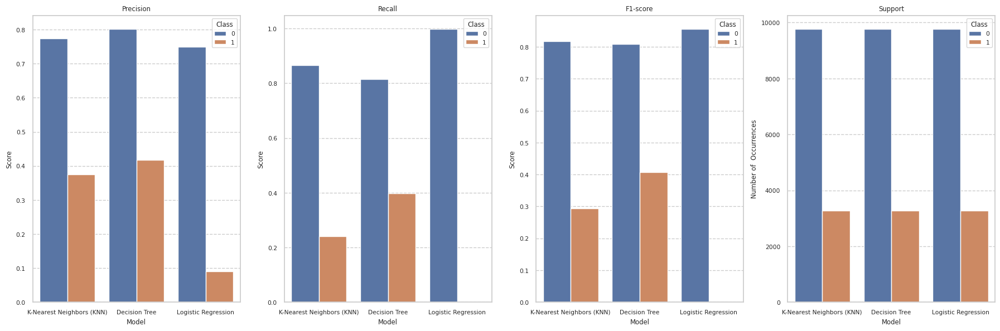

In [33]:
# Create DataFrame for class-wise metrics
class_metrics_df = pd.DataFrame({
    'Model': class_models,
    'Class': class_labels,
    'Precision': precisions,
    'Recall': recalls,
    'F1-score': f1_scores,
    'Support': support
})

# Set the font scale for all seaborn plots
sns.set(font_scale=0.7)

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Define the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 6))

# Plot for Precision
sns.barplot(data=class_metrics_df, x='Model', y='Precision', hue='Class', ax=axes[0])
axes[0].set_title('Precision')
axes[0].set_xlabel('Model')
axes[0].set_ylabel('Score')

# Plot for Recall
sns.barplot(data=class_metrics_df, x='Model', y='Recall', hue='Class', ax=axes[1])
axes[1].set_title('Recall')
axes[1].set_xlabel('Model')
axes[1].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='F1-score', hue='Class', ax=axes[2])
axes[2].set_title('F1-score')
axes[2].set_xlabel('Model')
axes[2].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='Support', hue='Class', ax=axes[3])
axes[3].set_title('Support')
axes[3].set_xlabel('Model')
axes[3].set_ylabel('Number of  Occurrences')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

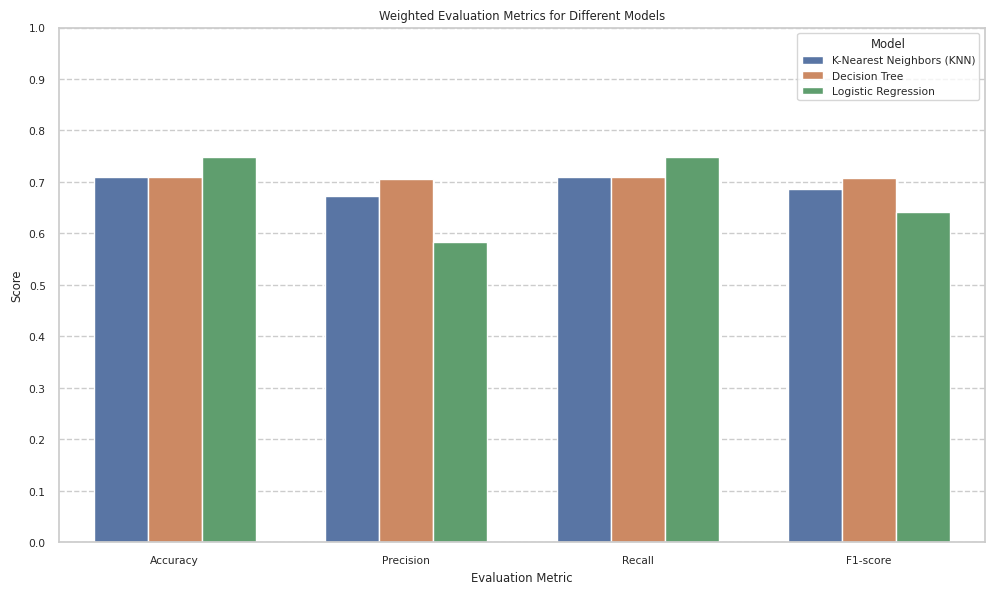

In [34]:
# Create DataFrame for weighted metrics
weighted_df = pd.DataFrame({'Model': weighted_models, 'Metric': weighted_metrics, 'Score': weighted_scores})

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Plot weighted metrics
plt.figure(figsize=(10, 6))
sns.barplot(data=weighted_df, x='Metric', y='Score', hue='Model', width=0.7)
plt.title('Weighted Evaluation Metrics for Different Models')
plt.xlabel('Evaluation Metric')
plt.ylabel('Score')
plt.xticks()
plt.legend(title='Model')

# Adjust the ticks on the y-axis
plt.yticks(np.arange(0, 1.1, 0.1))  # Set ticks from 0 to 1 with a step of 0.1
plt.ylim(0, 1)  # Set the range of y-axis from 0 to 1

plt.tight_layout()
plt.show()




---



# Performing Basic Feature Selection Techniques on the Dataset

In this section, we focus on optimizing our dataset by selecting the most relevant features for our analysis.

1. **Pair Plot Analysis**:
   We start by visualizing relationships between pairs of columns in our dataset using a pair plot. This plot helps us understand if there are any significant correlations between features. Specifically, we look for patterns where variables exhibit a proportional relationship along the diagonal, which indicates high correlation.

2. **Correlation Matrix and Heatmap Visualization**:
   Following the pair plot analysis, we construct a correlation matrix that quantifies the relationships between all pairs of features. To visualize this correlation matrix effectively, we use a heatmap. By examining the heatmap, we can easily identify features that are highly correlated (typically with correlation coefficients above 0.8).

3. **Feature Selection**:
   Based on insights gained from the pair plot and correlation matrix, we make decisions about which features to retain and which ones to discard. It's crucial to drop similar features or those with high correlations because they can introduce redundancy into our dataset. This redundancy may lead to multicollinearity issues, where the presence of highly correlated features can distort the results of statistical analyses or machine learning models.

4. **Model Training and Evaluation**: After feature selection, we utilize the modified dataset to train three models. Subsequently, we evaluate their performance to determine the effectiveness of our feature selection process.

In [35]:
# Generate descriptive statistics of the DataFrame
print("Descriptive statistics of the DataFrame:")
df.describe()

Descriptive statistics of the DataFrame:


,CHROM,REF,ALT,AF_ESP,AF_TGP,CLNVC,MC,ORIGIN,CLASS,Allele,Consequence,IMPACT,SYMBOL,Feature_type,Feature,BIOTYPE,Amino_acids,Codons,STRAND,LoFtool
count,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000,65188.000000
mean,9.998236,328.480993,166.576195,112.839234,79.897665,5.669632,48.786617,1.302249,0.252102,137.004694,25.567957,1.607842,1125.049595,0.999969,1068.883966,0.999785,573.075980,1077.545653,0.496564,611.293842
std,6.609745,202.139867,137.528981,397.419568,280.765739,1.322075,31.852798,2.372132,0.434223,121.772774,13.753848,0.745272,707.311226,0.005539,761.056479,0.014653,379.064653,543.742772,0.499992,417.594148
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,224.000000,0.000000,0.000000,0.000000,6.000000,19.000000,1.000000,0.000000,1.000000,17.000000,1.000000,413.750000,1.000000,347.000000,1.000000,201.000000,546.000000,0.000000,197.000000
50%,10.000000,273.000000,213.000000,0.000000,0.000000,6.000000,35.000000,1.000000,0.000000,88.000000,17.000000,2.000000,1213.000000,1.000000,997.000000,1.000000,577.000000,1163.000000,0.000000,581.000000
75%,16.000000,437.000000,335.000000,12.000000,12.000000,6.000000,89.000000,1.000000,1.000000,296.000000,46.000000,2.000000,1717.000000,1.000000,1768.000000,1.000000,905.000000,1428.000000,1.000000,1027.000000
max,23.000000,865.000000,457.000000,2841.000000,2086.000000,6.000000,89.000000,30.000000,1.000000,373.000000,47.000000,3.000000,2327.000000,1.000000,2368.000000,1.000000,1261.000000,2219.000000,1.000000,1194.000000


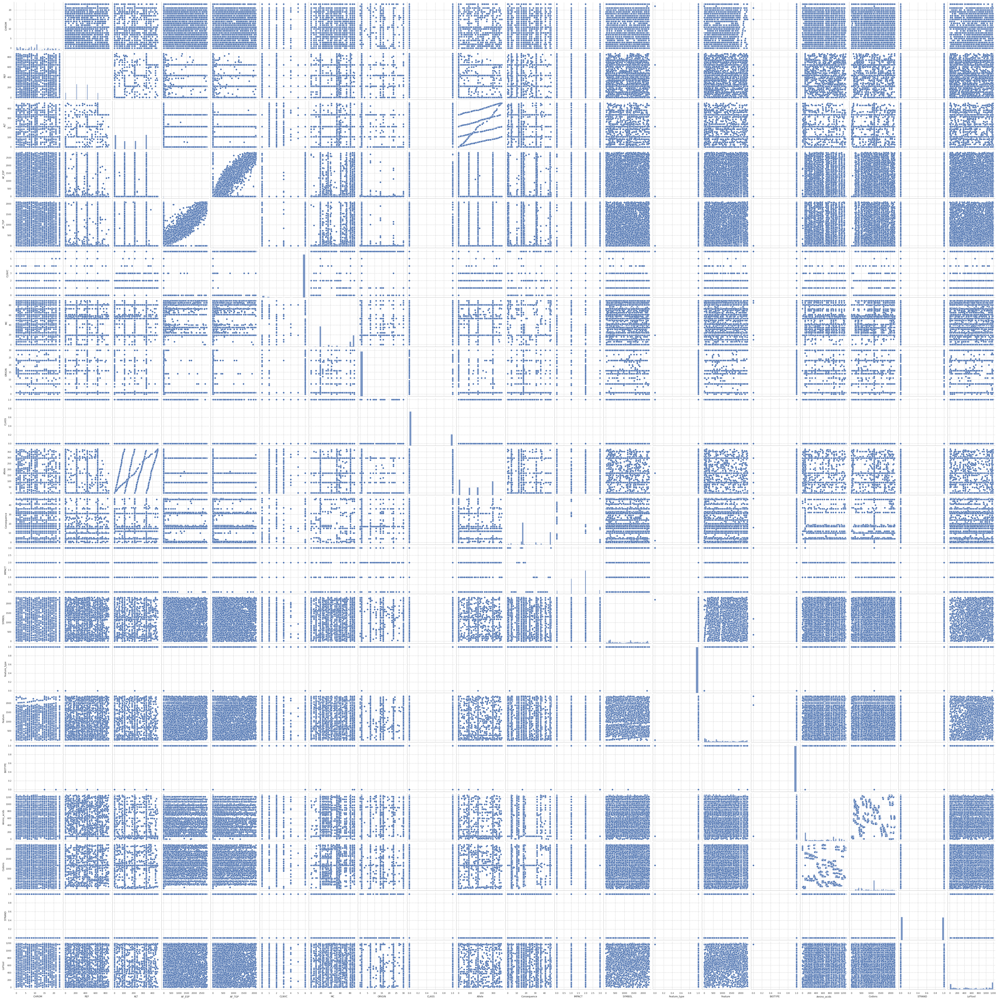

In [36]:
# Create pair plot
sns.pairplot(df)

# Show the plot
plt.show()

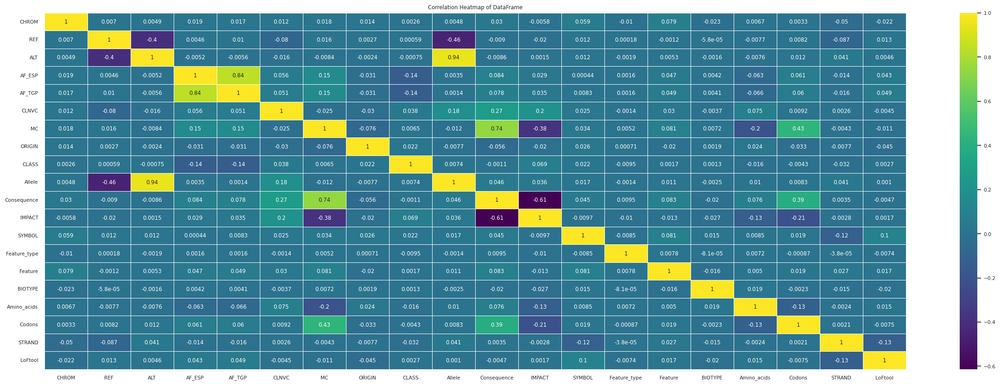

In [37]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create the heatmap
plt.figure(figsize=(30, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', linewidths=.5)
plt.title('Correlation Heatmap of DataFrame')
plt.show()

The pair plot reveals a noticeable proportional relationship between AF_ESP and AF_TGP. Additionally, these variables show a correlation coefficient exceeding 0.8 in the correlation matrix. Similarly, the correlation matrix indicates a correlation coefficient exceeding 0.8 between Allele and Alt. Therefore, we  will **drop the columns AF_TGP and ALT**.

In [38]:
# Drop the columns 'AF_TGP' and 'Alt'
basic_feature_selection_df = df.drop(['AF_TGP', 'ALT'], axis=1)

In [39]:
# Split the dataset into features (X) and target variable (y)
X = basic_feature_selection_df.drop(columns=['CLASS'])
y = basic_feature_selection_df['CLASS']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define models
models = {
    'K-Nearest Neighbors (KNN)': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression()
}

# Define empty lists to store class-wise evaluation metrics
class_models = []
class_labels = []
precisions = []
recalls = []
f1_scores = []
support = []

# Define empty lists to store weighted metrics
weighted_models = []
weighted_metrics = []
weighted_scores = []

# Train and evaluate models
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    print(f"\nModel: {model_name}")
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("\nClassification Report:")
    report = classification_report(y_test, y_pred, output_dict=True)
    print(classification_report(y_test, y_pred))

    # Store class-wise metrics
    for label, metrics in report.items():
        if label.isdigit():  # Check if label is a class
            class_models.append(model_name)
            class_labels.append(int(label))
            precisions.append(metrics['precision'])
            recalls.append(metrics['recall'])
            f1_scores.append(metrics['f1-score'])
            support.append(metrics['support'])

    # Store weighted metrics
    weighted_models.extend([model_name] * 4)  # 4 metrics
    weighted_metrics.extend(['Accuracy', 'Precision', 'Recall', 'F1-score'])
    weighted_scores.extend([report['accuracy'], report['weighted avg']['precision'],
                             report['weighted avg']['recall'], report['weighted avg']['f1-score']])


Model: K-Nearest Neighbors (KNN)

Confusion Matrix:
[[8470 1298]
 [2501  769]]

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.87      0.82      9768
           1       0.37      0.24      0.29      3270

    accuracy                           0.71     13038
   macro avg       0.57      0.55      0.55     13038
weighted avg       0.67      0.71      0.68     13038


Model: Decision Tree

Confusion Matrix:
[[7923 1845]
 [2029 1241]]

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.81      0.80      9768
           1       0.40      0.38      0.39      3270

    accuracy                           0.70     13038
   macro avg       0.60      0.60      0.60     13038
weighted avg       0.70      0.70      0.70     13038


Model: Logistic Regression

Confusion Matrix:
[[9768    0]
 [3270    0]]

Classification Report:
              precision    recall  f1-score   suppor

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

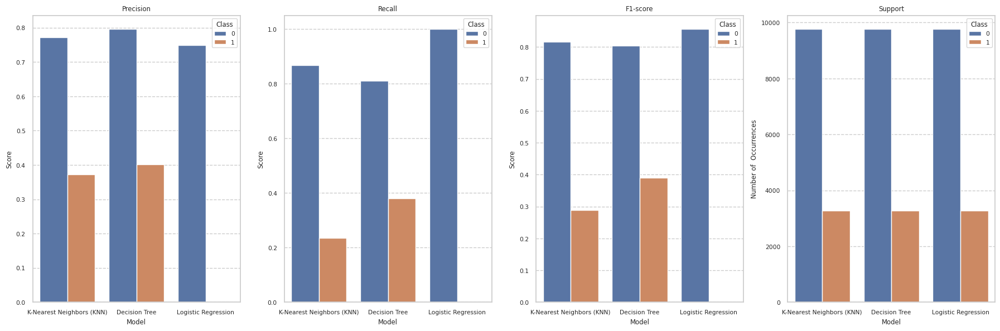

In [40]:
# Create DataFrame for class-wise metrics
class_metrics_df = pd.DataFrame({
    'Model': class_models,
    'Class': class_labels,
    'Precision': precisions,
    'Recall': recalls,
    'F1-score': f1_scores,
    'Support': support
})

# Set the font scale for all seaborn plots
sns.set(font_scale=0.7)

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Define the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 6))

# Plot for Precision
sns.barplot(data=class_metrics_df, x='Model', y='Precision', hue='Class', ax=axes[0])
axes[0].set_title('Precision')
axes[0].set_xlabel('Model')
axes[0].set_ylabel('Score')

# Plot for Recall
sns.barplot(data=class_metrics_df, x='Model', y='Recall', hue='Class', ax=axes[1])
axes[1].set_title('Recall')
axes[1].set_xlabel('Model')
axes[1].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='F1-score', hue='Class', ax=axes[2])
axes[2].set_title('F1-score')
axes[2].set_xlabel('Model')
axes[2].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='Support', hue='Class', ax=axes[3])
axes[3].set_title('Support')
axes[3].set_xlabel('Model')
axes[3].set_ylabel('Number of  Occurrences')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

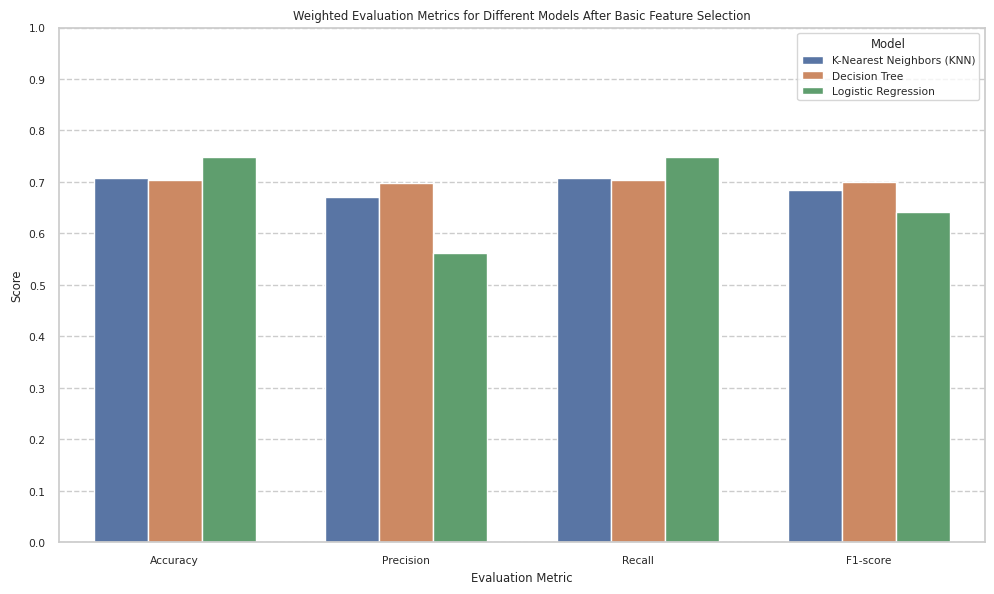

In [41]:
# Create DataFrame for weighted metrics
weighted_df = pd.DataFrame({'Model': weighted_models, 'Metric': weighted_metrics, 'Score': weighted_scores})

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Plot weighted metrics
plt.figure(figsize=(10, 6))
sns.barplot(data=weighted_df, x='Metric', y='Score', hue='Model', width=0.7)
plt.title('Weighted Evaluation Metrics for Different Models After Basic Feature Selection')
plt.xlabel('Evaluation Metric')
plt.ylabel('Score')
plt.xticks()
plt.legend(title='Model')

# Adjust the ticks on the y-axis
plt.yticks(np.arange(0, 1.1, 0.1))  # Set ticks from 0 to 1 with a step of 0.1
plt.ylim(0, 1)  # Set the range of y-axis from 0 to 1

plt.tight_layout()
plt.show()



---



# Performing One Filter or Wrapper Feature Selection Technique

In this section, we employ Lasso regression as a feature selection technique.

1. **Perform Lasso regression**:
   We instantiate a LassoCV model with cross-validation and fit it to the training data. This regression technique helps identify the most relevant features by penalizing the coefficients of less important features.

2. **Select Features based on Lasso Coefficients**:
   After fitting the Lasso model, we extract the selected features based on the coefficients obtained. We use the SelectFromModel function to choose features with non-zero coefficients, indicating their importance according to Lasso regression.

3. **Model Training and Evaluation**:
   Following feature selection with Lasso regression, we utilize the modified dataset (X_train_selected, X_test_selected) to train three models. Subsequently, we evaluate the performance of these models to assess the effectiveness of our feature selection process.


In [42]:
from sklearn.linear_model import LassoCV
from sklearn.feature_selection import SelectFromModel

filter_wrapper_df = df.copy()

# Split the dataset into features (X) and target variable (y)
X = filter_wrapper_df.drop(columns=['CLASS'])
y = filter_wrapper_df['CLASS']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform Lasso regression
lasso = LassoCV(cv=5)
lasso.fit(X_train, y_train)

# Select features based on the coefficients from Lasso
selected_features = SelectFromModel(lasso, prefit=True).get_support()
X_train_selected = X_train.loc[:, selected_features]
X_test_selected = X_test.loc[:, selected_features]

# Define models
models = {
    'K-Nearest Neighbors (KNN)': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression()
}

# Define empty lists to store class-wise evaluation metrics
class_models = []
class_labels = []
precisions = []
recalls = []
f1_scores = []
support = []

# Define empty lists to store weighted metrics
weighted_models = []
weighted_metrics = []
weighted_scores = []

# Train and evaluate models
for model_name, model in models.items():
    # Train the model
    model.fit(X_train_selected, y_train)

    # Make predictions
    y_pred = model.predict(X_test_selected)

    # Evaluate the model
    print(f"\nModel: {model_name}")
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("\nClassification Report:")
    report = classification_report(y_test, y_pred, output_dict=True)
    print(classification_report(y_test, y_pred))

    # Store class-wise metrics
    for label, metrics in report.items():
        if label.isdigit():  # Check if label is a class
            class_models.append(model_name)
            class_labels.append(int(label))
            precisions.append(metrics['precision'])
            recalls.append(metrics['recall'])
            f1_scores.append(metrics['f1-score'])
            support.append(metrics['support'])

    # Store weighted metrics
    weighted_models.extend([model_name] * 4)  # 4 metrics
    weighted_metrics.extend(['Accuracy', 'Precision', 'Recall', 'F1-score'])
    weighted_scores.extend([report['accuracy'], report['weighted avg']['precision'],
                             report['weighted avg']['recall'], report['weighted avg']['f1-score']])


Model: K-Nearest Neighbors (KNN)

Confusion Matrix:
[[8541 1227]
 [2463  807]]

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.87      0.82      9768
           1       0.40      0.25      0.30      3270

    accuracy                           0.72     13038
   macro avg       0.59      0.56      0.56     13038
weighted avg       0.68      0.72      0.69     13038


Model: Decision Tree

Confusion Matrix:
[[7973 1795]
 [1991 1279]]

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.82      0.81      9768
           1       0.42      0.39      0.40      3270

    accuracy                           0.71     13038
   macro avg       0.61      0.60      0.61     13038
weighted avg       0.70      0.71      0.71     13038


Model: Logistic Regression

Confusion Matrix:
[[9750   18]
 [3267    3]]

Classification Report:
              precision    recall  f1-score   suppor

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


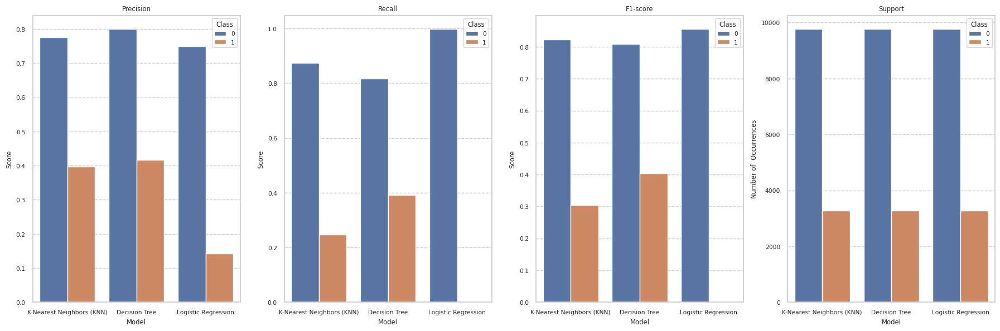

In [43]:
# Create DataFrame for class-wise metrics
class_metrics_df = pd.DataFrame({
    'Model': class_models,
    'Class': class_labels,
    'Precision': precisions,
    'Recall': recalls,
    'F1-score': f1_scores,
    'Support': support
})

# Set the font scale for all seaborn plots
sns.set(font_scale=0.7)

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Define the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 6))

# Plot for Precision
sns.barplot(data=class_metrics_df, x='Model', y='Precision', hue='Class', ax=axes[0])
axes[0].set_title('Precision')
axes[0].set_xlabel('Model')
axes[0].set_ylabel('Score')

# Plot for Recall
sns.barplot(data=class_metrics_df, x='Model', y='Recall', hue='Class', ax=axes[1])
axes[1].set_title('Recall')
axes[1].set_xlabel('Model')
axes[1].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='F1-score', hue='Class', ax=axes[2])
axes[2].set_title('F1-score')
axes[2].set_xlabel('Model')
axes[2].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='Support', hue='Class', ax=axes[3])
axes[3].set_title('Support')
axes[3].set_xlabel('Model')
axes[3].set_ylabel('Number of  Occurrences')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

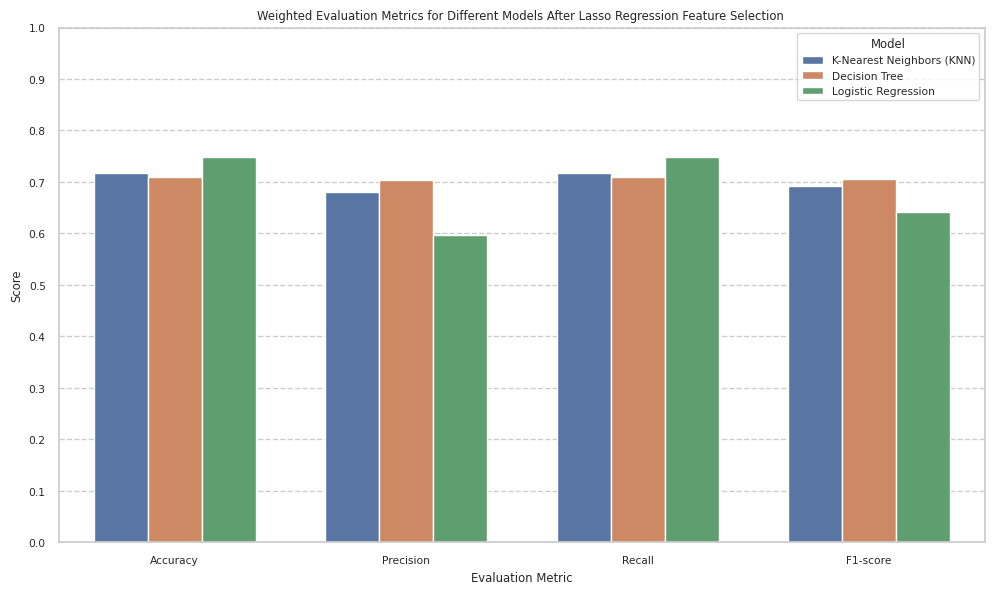

In [44]:
# Create DataFrame for weighted metrics
weighted_df = pd.DataFrame({'Model': weighted_models, 'Metric': weighted_metrics, 'Score': weighted_scores})

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Plot weighted metrics
plt.figure(figsize=(10, 6))
sns.barplot(data=weighted_df, x='Metric', y='Score', hue='Model', width=0.7)
plt.title('Weighted Evaluation Metrics for Different Models After Lasso Regression Feature Selection ')
plt.xlabel('Evaluation Metric')
plt.ylabel('Score')
plt.xticks()
plt.legend(title='Model')

# Adjust the ticks on the y-axis
plt.yticks(np.arange(0, 1.1, 0.1))  # Set ticks from 0 to 1 with a step of 0.1
plt.ylim(0, 1)  # Set the range of y-axis from 0 to 1

plt.tight_layout()
plt.show()



---



# Performing PCA for Feature Extraction Technique

In this section, we utilize Principal Component Analysis (PCA) as a feature extraction technique.

1. **Perform PCA**:
   We perform linear dimensionality reduction using Principal Component Analysis (PCA). The PCA function is used to reduce the number of features while preserving most of the variance in the data. We specify n_components=15 to reduce the dimensions to 15.

2. **Transforming Features**:
   After fitting PCA on the training data, we transform both the training and testing features into the reduced-dimensional space. This step ensures that our model operates on the transformed features.

3. **Model Training and Evaluation**:
   We utilize the transformed dataset (X_train_pca, X_test_pca) to train three models. Subsequently, we evaluate their performance to determine the effectiveness of our feature extraction process.


In [45]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

pca_df = df.copy()

# Split the dataset into features (X) and target variable (y)
X = pca_df.drop(columns=['CLASS'])
y = pca_df['CLASS']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform Linear dimensionality reduction using Principal Component Analysis (PCA)
pca = PCA(n_components=15)  # Reduce to 15 dimensions
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Define models
models = {
    'K-Nearest Neighbors (KNN)': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression()
}

# Define empty lists to store class-wise evaluation metrics
class_models = []
class_labels = []
precisions = []
recalls = []
f1_scores = []
support = []

# Define empty lists to store weighted metrics
weighted_models = []
weighted_metrics = []
weighted_scores = []

# Train and evaluate models
for model_name, model in models.items():
    # Train the model
    model.fit(X_train_pca, y_train)

    # Make predictions
    y_pred = model.predict(X_test_pca)

    # Evaluate the model
    print(f"\nModel: {model_name}")
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("\nClassification Report:")
    report = classification_report(y_test, y_pred, output_dict=True)
    print(classification_report(y_test, y_pred))

    # Store class-wise metrics
    for label, metrics in report.items():
        if label.isdigit():  # Check if label is a class
            class_models.append(model_name)
            class_labels.append(int(label))
            precisions.append(metrics['precision'])
            recalls.append(metrics['recall'])
            f1_scores.append(metrics['f1-score'])
            support.append(metrics['support'])

    # Store weighted metrics
    weighted_models.extend([model_name] * 4)  # 4 metrics
    weighted_metrics.extend(['Accuracy', 'Precision', 'Recall', 'F1-score'])
    weighted_scores.extend([report['accuracy'], report['weighted avg']['precision'],
                             report['weighted avg']['recall'], report['weighted avg']['f1-score']])


Model: K-Nearest Neighbors (KNN)

Confusion Matrix:
[[8475 1293]
 [2490  780]]

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.87      0.82      9768
           1       0.38      0.24      0.29      3270

    accuracy                           0.71     13038
   macro avg       0.57      0.55      0.55     13038
weighted avg       0.67      0.71      0.69     13038


Model: Decision Tree

Confusion Matrix:
[[7766 2002]
 [2126 1144]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.80      0.79      9768
           1       0.36      0.35      0.36      3270

    accuracy                           0.68     13038
   macro avg       0.57      0.57      0.57     13038
weighted avg       0.68      0.68      0.68     13038


Model: Logistic Regression

Confusion Matrix:
[[9614  154]
 [3215   55]]

Classification Report:
              precision    recall  f1-score   suppor

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


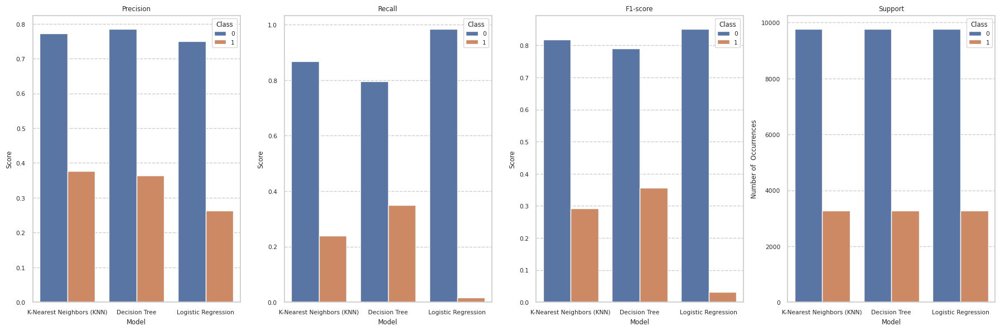

In [46]:
# Create DataFrame for class-wise metrics
class_metrics_df = pd.DataFrame({
    'Model': class_models,
    'Class': class_labels,
    'Precision': precisions,
    'Recall': recalls,
    'F1-score': f1_scores,
    'Support': support
})

# Set the font scale for all seaborn plots
sns.set(font_scale=0.7)

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Define the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 6))

# Plot for Precision
sns.barplot(data=class_metrics_df, x='Model', y='Precision', hue='Class', ax=axes[0])
axes[0].set_title('Precision')
axes[0].set_xlabel('Model')
axes[0].set_ylabel('Score')

# Plot for Recall
sns.barplot(data=class_metrics_df, x='Model', y='Recall', hue='Class', ax=axes[1])
axes[1].set_title('Recall')
axes[1].set_xlabel('Model')
axes[1].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='F1-score', hue='Class', ax=axes[2])
axes[2].set_title('F1-score')
axes[2].set_xlabel('Model')
axes[2].set_ylabel('Score')

# Plot for F1-score
sns.barplot(data=class_metrics_df, x='Model', y='Support', hue='Class', ax=axes[3])
axes[3].set_title('Support')
axes[3].set_xlabel('Model')
axes[3].set_ylabel('Number of  Occurrences')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

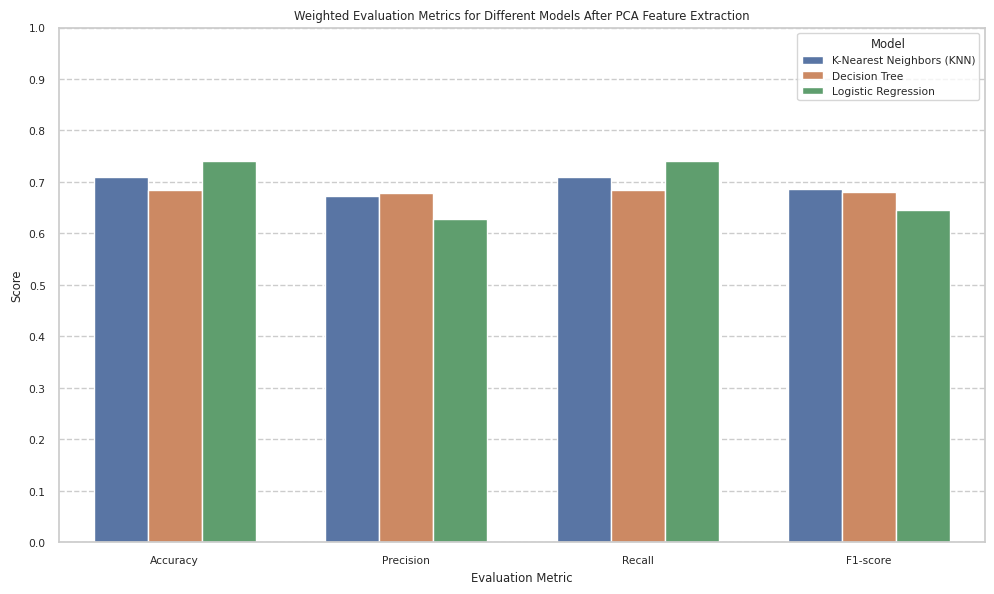

In [47]:
# Create DataFrame for weighted metrics
weighted_df = pd.DataFrame({'Model': weighted_models, 'Metric': weighted_metrics, 'Score': weighted_scores})

# Set the style to enable the grid and make it dotted
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# Plot weighted metrics
plt.figure(figsize=(10, 6))
sns.barplot(data=weighted_df, x='Metric', y='Score', hue='Model', width=0.7)
plt.title('Weighted Evaluation Metrics for Different Models After PCA Feature Extraction')
plt.xlabel('Evaluation Metric')
plt.ylabel('Score')
plt.xticks()
plt.legend(title='Model')

# Adjust the ticks on the y-axis
plt.yticks(np.arange(0, 1.1, 0.1))  # Set ticks from 0 to 1 with a step of 0.1
plt.ylim(0, 1)  # Set the range of y-axis from 0 to 1

plt.tight_layout()
plt.show()



---

